# (29) amort — celeba

**Motivation**: host = ```mach```, device = ```cuda:1``` <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-progress-2025/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-progress-2025/figs')
tmp_dir = os.path.join(git_dir, 'jb-progress-2025/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_TemporalSC'))
from figures.convergence import plot_convergence
from main.config_defaults import default_configs
from figures.fighelper import *
from main.train import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 1
device = f'cuda:{device_idx}'

print(f"device: {device}  ———  host: {os.uname().nodename}")

device: cuda:1  ———  host: mach

## Make a model

```conv|deep```

In [3]:
model_type = 'poisson'
cfg_vae, cfg_tr = default_configs('CelebA', model_type, 'conv|deep')

cfg_vae['t_train'] = 1
cfg_vae['kl_beta'] = 1.0

cfg_vae['latent_channels'] = 256
cfg_vae['latent_pixels'] = 16

cfg_tr['batch_size'] = 40
cfg_tr['epochs'] = 30

cfg_tr['eval_freq'] = 1
cfg_tr['chkpt_freq'] = 1

In [4]:
model = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**cfg_vae))
tr = Trainer(model, ConfigTrain(**cfg_tr), device=device)

tr.n_iters

122070

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|    IPVAE    |  1.9 Mil   |
|     ———     |    ———     |
|    layer    |  1.9 Mil   |
+-------------+------------+

poisson_CelebA_t-1_b-1_kms-(256,16,1)_<conv|deep>
b40-ep30-lr(5e-05)_temp(0.05)_gr(30000)_(2025_07_29,23:25)

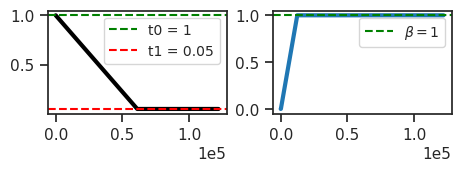

In [5]:
model.print()
tr.print()
tr.show_schedules()

In [6]:
model.layer.n_exp

tensor([10], device='cuda:1', dtype=torch.int32)

In [7]:
print(f"{tr.model.layer}") # \n{tr.model.layer.dec}")

PoissonLayer(latent_sz=(256, 16, 16), input_sz=(3, 128, 128), temp=1)

In [8]:
print_num_params(tr.model.layer)

+--------------+------------+
| Module Name  | Num Params |
+--------------+------------+
| PoissonLayer |  1.9 Mil   |
|     ———      |    ———     |
|     enc      |  1.2 Mil   |
|     dec      |  690.2 K   |
|    u_init    |    256     |
+--------------+------------+

In [9]:
tr.model.cfg.set_clamp_val('u', 5.0)
tr.model.cfg.set_clamp_val('du', 5.0)

tr.model.cfg.clamp_vals

{'u': (5.0,), 'du': (5.0,), 'dec': 3.45}

In [10]:
print(f"\n\n{vars(tr.model.cfg)}\n\n{vars(tr.cfg)}\n")

{'prior_log_dist': 'uniform', 'clamp_prior': -2, 't_train': 1, 'kl_beta': 1.0, 'latent_channels': 256, 
'latent_pixels': 16, 'latent_stride': 1, 'enc_type': 'conv', 'dec_type': 'deep', 'recon_mode': 'mse', 'dataset': 
'CelebA', 'dataset_name': 'CelebA', 'feeder': 'stationary', 'feeder_cfg': {}, 'input_sz': (3, 128, 128), 
'latent_sz': (256, 16, 16), 'init_dist': 'normal', 'init_scale': 0.0001, 'clamp_vals': {'u': (5.0,), 'du': (5.0,), 
'dec': 3.45}, 'optim_sigma': False, 'stochastic': True, 'fit_prior': True, 'seed': 0, 'track_stats': False, 
'base_dir': '/home/hadi/Projects/PoissonVAE', 'data_dir': '/home/hadi/Datasets', 'runs_dir': 
'/home/hadi/Projects/PoissonVAE/runs/poisson_CelebA_t-1_b-1_kms-(256,16,1)_<conv|deep>', 'mods_dir': 
'/home/hadi/Projects/PoissonVAE/models/poisson_CelebA_t-1_b-1_kms-(256,16,1)_<conv|deep>', 'results_dir': 
'/home/hadi/Projects/PoissonVAE/results'}

{'lr': 5e-05, 'epochs': 30, 'batch_size': 40, 'dataset_kws': None, 'warm_restart': 0, 'warmup_portion': 0.005, 
'optimizer': 'adamax_fast', 'optimizer_kws': {'weight_decay': 0.001, 'betas': (0.9, 0.999), 'eps': 1e-08}, 
'scheduler_type': 'cosine', 'scheduler_kws': {'T_max': 29.85, 'eta_min': 1e-06}, 'ema_rate': None, 'grad_clip': 
30000, 'chkpt_freq': 1, 'eval_freq': 1, 'log_freq': 10, 'kl_beta_min': 0.0001, 'kl_const_portion': 0.001, 
'kl_anneal_portion': 0.1, 'temp_anneal_portion': 0.5, 'temp_anneal_type': 'lin', 'temp_start': 1.0, 'temp_stop': 
0.05}

In [11]:
tr.train('amort_no-se')

wandb: ERROR Failed to detect the name of this notebook. You can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Warning: Could not save code info: Reference at 'refs/heads/main' does not exist

Warning: Could not save notebook info: Can't identify the notebook path.

epoch # 30, avg loss: 2016.667: 100%|████████| 30/30 [2:14:17<00:00, 268.58s/it]


In [15]:
%%time

kws = dict(
    t_total=1,
    n_data_batches=-1,
    compute_sprs=False,
)
results = tr.analysis('vld', **kws)
print({
    k: v for k, v in results.items()
    if 'state' not in k and 'samples' not in k
})

100%|███████████████████████████████| 497/497 [00:15<00:00, 31.14it/s]


{
    'kl': array([655.175], dtype=float32),
    'r2': array([0.87574816], dtype=float32),
    'mse': array([1431.], dtype=float32),
    'loss': array([2086.175], dtype=float32),
    'du_norm': array([1202.9163], dtype=float32),
    'lifetime': array([nan]),
    'population': array([nan]),
    '%-zeros': array([0.96333422])
}

CPU times: user 10min 49s, sys: 8.09 s, total: 10min 57s
Wall time: 22.8 s


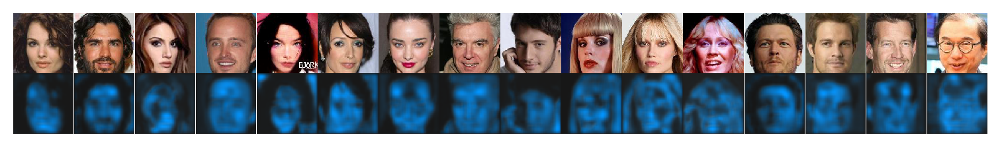

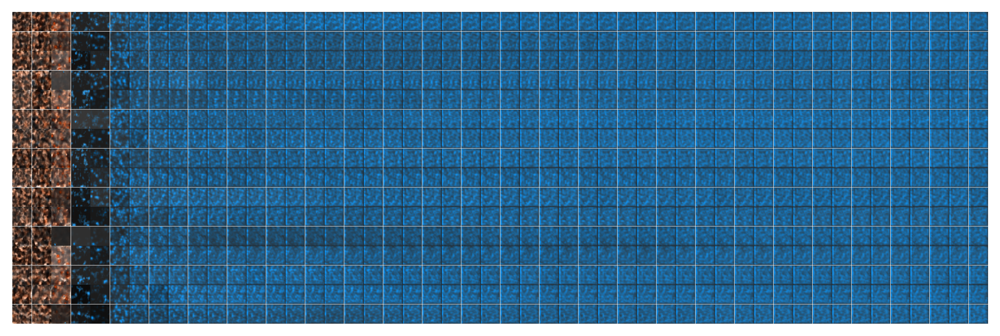

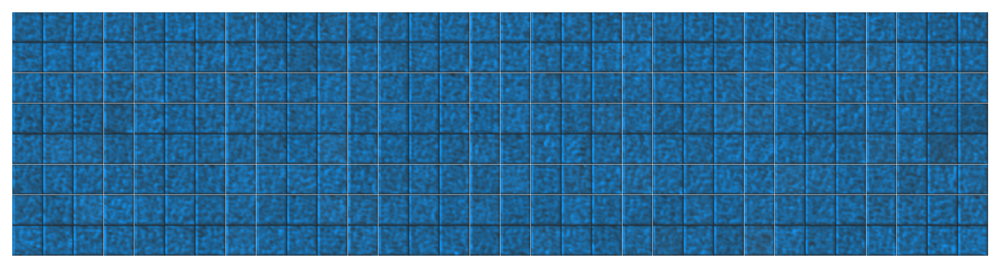

In [16]:
tr.show_recon();
tr.show_samples();

## Make a model

```conv|lin```

In [3]:
model_type = 'poisson'
cfg_vae, cfg_tr = default_configs('CelebA', model_type, 'conv|lin')

cfg_vae['t_train'] = 1
cfg_vae['kl_beta'] = 1.0

cfg_vae['latent_channels'] = 256
cfg_vae['latent_pixels'] = 16
cfg_vae['latent_stride'] = 6

cfg_tr['batch_size'] = 40
cfg_tr['epochs'] = 30

cfg_tr['eval_freq'] = 1
cfg_tr['chkpt_freq'] = 1

In [4]:
model = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**cfg_vae))
tr = Trainer(model, ConfigTrain(**cfg_tr), device=device)

tr.n_iters

122070

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|    IPVAE    |  2.3 Mil   |
|     ———     |    ———     |
|    layer    |  2.3 Mil   |
+-------------+------------+

poisson_CelebA_t-1_b-1_kms-(256,16,6)_<conv|lin>
b40-ep30-lr(5e-05)_temp(0.05)_gr(30000)_(2025_07_30,08:24)

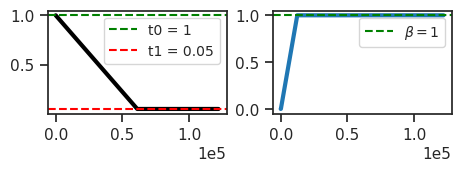

In [5]:
model.print()
tr.print()
tr.show_schedules()

In [6]:
model.layer.n_exp

tensor([10], device='cuda:1', dtype=torch.int32)

In [7]:
print(f"{tr.model.layer}") # \n{tr.model.layer.dec}")

PoissonLayer(latent_sz=(256, 16, 16), input_sz=(3, 128, 128), temp=1)

In [8]:
print_num_params(tr.model.layer)

+--------------+------------+
| Module Name  | Num Params |
+--------------+------------+
| PoissonLayer |  2.3 Mil   |
|     ———      |    ———     |
|     enc      |  1.2 Mil   |
|     dec      |  1.1 Mil   |
|    u_init    |    256     |
+--------------+------------+

In [9]:
tr.model.layer.dec

ConvDictionary(in_channels=256, out_channels=3, kernel_size=38, stride=6)

In [10]:
tr.model.cfg.set_clamp_val('u', 5.0)
tr.model.cfg.set_clamp_val('du', 5.0)

tr.model.cfg.clamp_vals

{'u': (5.0,), 'du': (5.0,), 'dec': 3.45}

In [11]:
print(f"\n\n{vars(tr.model.cfg)}\n\n{vars(tr.cfg)}\n")

{'prior_log_dist': 'uniform', 'clamp_prior': -4, 't_train': 1, 'kl_beta': 1.0, 'latent_channels': 256, 
'latent_pixels': 16, 'latent_stride': 6, 'enc_type': 'conv', 'dec_type': 'lin', 'recon_mode': 'mse', 'dataset': 
'CelebA', 'dataset_name': 'CelebA', 'feeder': 'stationary', 'feeder_cfg': {}, 'input_sz': (3, 128, 128), 
'latent_sz': (256, 16, 16), 'init_dist': 'normal', 'init_scale': 0.0001, 'clamp_vals': {'u': (5.0,), 'du': (5.0,), 
'dec': 3.45}, 'optim_sigma': False, 'stochastic': True, 'fit_prior': True, 'seed': 0, 'track_stats': False, 
'base_dir': '/home/hadi/Projects/PoissonVAE', 'data_dir': '/home/hadi/Datasets', 'runs_dir': 
'/home/hadi/Projects/PoissonVAE/runs/poisson_CelebA_t-1_b-1_kms-(256,16,6)_<conv|lin>', 'mods_dir': 
'/home/hadi/Projects/PoissonVAE/models/poisson_CelebA_t-1_b-1_kms-(256,16,6)_<conv|lin>', 'results_dir': 
'/home/hadi/Projects/PoissonVAE/results'}

{'lr': 5e-05, 'epochs': 30, 'batch_size': 40, 'dataset_kws': None, 'warm_restart': 0, 'warmup_portion': 0.005, 
'optimizer': 'adamax_fast', 'optimizer_kws': {'weight_decay': 0.001, 'betas': (0.9, 0.999), 'eps': 1e-08}, 
'scheduler_type': 'cosine', 'scheduler_kws': {'T_max': 29.85, 'eta_min': 1e-06}, 'ema_rate': None, 'grad_clip': 
30000, 'chkpt_freq': 1, 'eval_freq': 1, 'log_freq': 10, 'kl_beta_min': 0.0001, 'kl_const_portion': 0.001, 
'kl_anneal_portion': 0.1, 'temp_anneal_portion': 0.5, 'temp_anneal_type': 'lin', 'temp_start': 1.0, 'temp_stop': 
0.05}

In [12]:
tr.train('amort_no-se')

wandb: ERROR Failed to detect the name of this notebook. You can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Warning: Could not save code info: Reference at 'refs/heads/main' does not exist

Warning: Could not save notebook info: Can't identify the notebook path.

epoch # 30, avg loss: 3908.509: 100%|████████| 30/30 [1:26:44<00:00, 173.50s/it]


In [13]:
%%time

kws = dict(
    t_total=1,
    n_data_batches=-1,
    compute_sprs=False,
)
results = tr.analysis('vld', **kws)
print({
    k: v for k, v in results.items()
    if 'state' not in k and 'samples' not in k
})

100%|███████████████████████████████| 497/497 [00:10<00:00, 46.15it/s]


{
    'kl': array([910.2138], dtype=float32),
    'r2': array([0.7418975], dtype=float32),
    'mse': array([3049.6572], dtype=float32),
    'loss': array([3959.871], dtype=float32),
    'du_norm': array([3852.9666], dtype=float32),
    'lifetime': array([nan]),
    'population': array([nan]),
    '%-zeros': array([0.99337554])
}

CPU times: user 8min 19s, sys: 5.75 s, total: 8min 25s
Wall time: 15.6 s


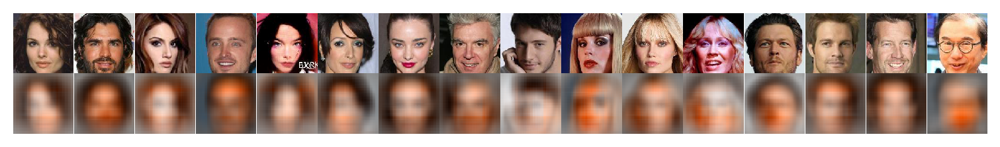

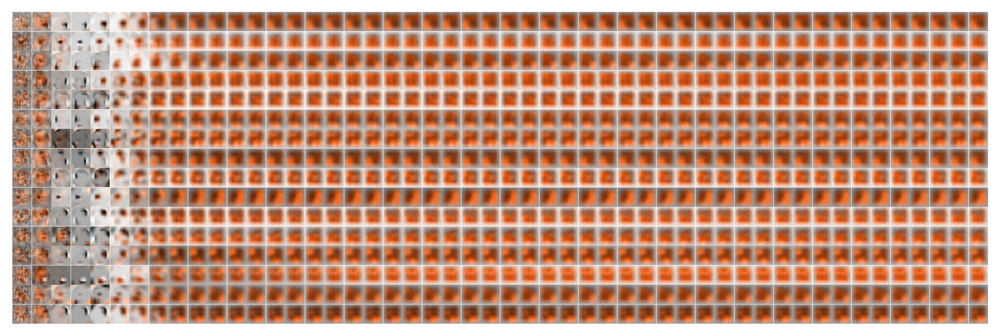

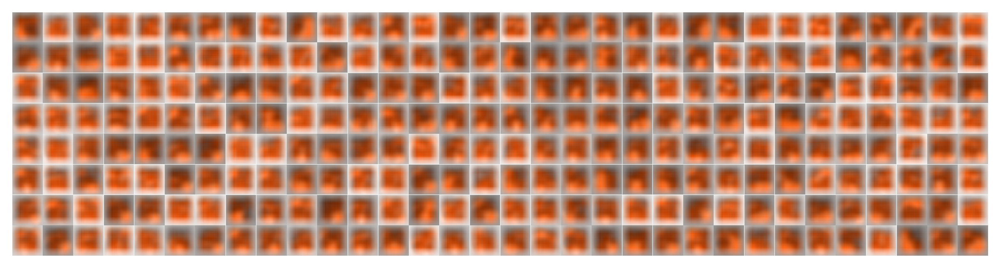

In [14]:
tr.show_recon();
tr.show_samples();

## Make a model

```conv|lin``` + lower $\beta$

In [15]:
model_type = 'poisson'
cfg_vae, cfg_tr = default_configs('CelebA', model_type, 'conv|lin')

cfg_vae['t_train'] = 1
cfg_vae['kl_beta'] = 0.1

cfg_vae['latent_channels'] = 256
cfg_vae['latent_pixels'] = 16
cfg_vae['latent_stride'] = 6

cfg_tr['batch_size'] = 40
cfg_tr['epochs'] = 30

cfg_tr['eval_freq'] = 1
cfg_tr['chkpt_freq'] = 1

In [16]:
model = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**cfg_vae))
tr = Trainer(model, ConfigTrain(**cfg_tr), device=device)

tr.n_iters

122070

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|    IPVAE    |  2.3 Mil   |
|     ———     |    ———     |
|    layer    |  2.3 Mil   |
+-------------+------------+

poisson_CelebA_t-1_b-0.1_kms-(256,16,6)_<conv|lin>
b40-ep30-lr(5e-05)_temp(0.05)_gr(30000)_(2025_07_30,09:58)

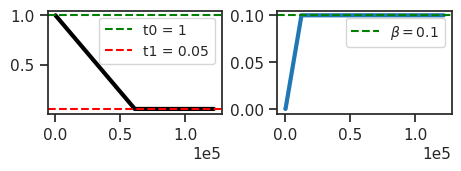

In [17]:
model.print()
tr.print()
tr.show_schedules()

In [18]:
model.layer.n_exp

tensor([10], device='cuda:1', dtype=torch.int32)

In [19]:
print(f"{tr.model.layer}") # \n{tr.model.layer.dec}")

PoissonLayer(latent_sz=(256, 16, 16), input_sz=(3, 128, 128), temp=1)

In [20]:
print_num_params(tr.model.layer)

+--------------+------------+
| Module Name  | Num Params |
+--------------+------------+
| PoissonLayer |  2.3 Mil   |
|     ———      |    ———     |
|     enc      |  1.2 Mil   |
|     dec      |  1.1 Mil   |
|    u_init    |    256     |
+--------------+------------+

In [21]:
tr.model.layer.dec

ConvDictionary(in_channels=256, out_channels=3, kernel_size=38, stride=6)

In [22]:
tr.model.cfg.set_clamp_val('u', 5.0)
tr.model.cfg.set_clamp_val('du', 5.0)

tr.model.cfg.clamp_vals

{'u': (5.0,), 'du': (5.0,), 'dec': 3.45}

In [23]:
print(f"\n\n{vars(tr.model.cfg)}\n\n{vars(tr.cfg)}\n")

{'prior_log_dist': 'uniform', 'clamp_prior': -4, 't_train': 1, 'kl_beta': 0.1, 'latent_channels': 256, 
'latent_pixels': 16, 'latent_stride': 6, 'enc_type': 'conv', 'dec_type': 'lin', 'recon_mode': 'mse', 'dataset': 
'CelebA', 'dataset_name': 'CelebA', 'feeder': 'stationary', 'feeder_cfg': {}, 'input_sz': (3, 128, 128), 
'latent_sz': (256, 16, 16), 'init_dist': 'normal', 'init_scale': 0.0001, 'clamp_vals': {'u': (5.0,), 'du': (5.0,), 
'dec': 3.45}, 'optim_sigma': False, 'stochastic': True, 'fit_prior': True, 'seed': 0, 'track_stats': False, 
'base_dir': '/home/hadi/Projects/PoissonVAE', 'data_dir': '/home/hadi/Datasets', 'runs_dir': 
'/home/hadi/Projects/PoissonVAE/runs/poisson_CelebA_t-1_b-0.1_kms-(256,16,6)_<conv|lin>', 'mods_dir': 
'/home/hadi/Projects/PoissonVAE/models/poisson_CelebA_t-1_b-0.1_kms-(256,16,6)_<conv|lin>', 'results_dir': 
'/home/hadi/Projects/PoissonVAE/results'}

{'lr': 5e-05, 'epochs': 30, 'batch_size': 40, 'dataset_kws': None, 'warm_restart': 0, 'warmup_portion': 0.005, 
'optimizer': 'adamax_fast', 'optimizer_kws': {'weight_decay': 0.001, 'betas': (0.9, 0.999), 'eps': 1e-08}, 
'scheduler_type': 'cosine', 'scheduler_kws': {'T_max': 29.85, 'eta_min': 1e-06}, 'ema_rate': None, 'grad_clip': 
30000, 'chkpt_freq': 1, 'eval_freq': 1, 'log_freq': 10, 'kl_beta_min': 0.0001, 'kl_const_portion': 0.001, 
'kl_anneal_portion': 0.1, 'temp_anneal_portion': 0.5, 'temp_anneal_type': 'lin', 'temp_start': 1.0, 'temp_stop': 
0.05}

In [24]:
tr.train('amort_no-se')

Warning: Could not save code info: Reference at 'refs/heads/main' does not exist

Warning: Could not save notebook info: Can't identify the notebook path.

epoch # 30, avg loss: 2492.579: 100%|████████| 30/30 [1:28:38<00:00, 177.29s/it]


In [25]:
%%time

kws = dict(
    t_total=1,
    n_data_batches=-1,
    compute_sprs=False,
)
results = tr.analysis('vld', **kws)
print({
    k: v for k, v in results.items()
    if 'state' not in k and 'samples' not in k
})

100%|███████████████████████████████| 497/497 [00:12<00:00, 39.16it/s]


{
    'kl': array([3434.979], dtype=float32),
    'r2': array([0.81600064], dtype=float32),
    'mse': array([2180.6653], dtype=float32),
    'loss': array([5615.6445], dtype=float32),
    'du_norm': array([11836.971], dtype=float32),
    'lifetime': array([nan]),
    'population': array([nan]),
    '%-zeros': array([0.99077445])
}

CPU times: user 9min 42s, sys: 9.8 s, total: 9min 52s
Wall time: 18.5 s


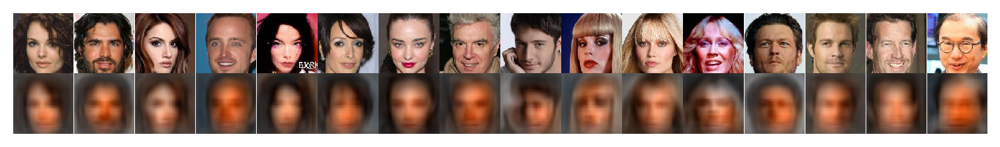

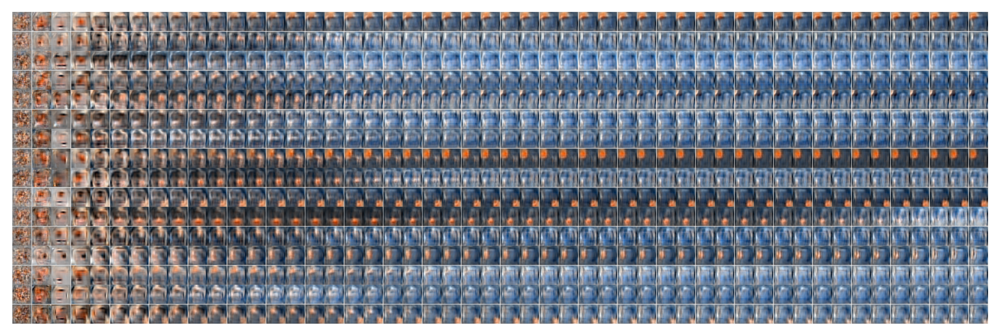

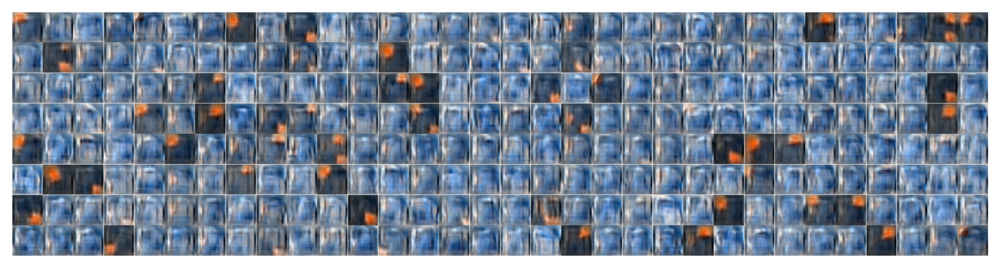

In [26]:
tr.show_recon();
tr.show_samples();